In [1]:
!nvidia-smi

Mon Jul 10 08:18:38 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                  N/A |
| N/A   55C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

#Tải YoLoV5 từ gitHub để tiến hành Train

In [2]:
!git clone https://github.com/Zrmikstri/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 12355, done.
remote: Total 12355 (delta 0), reused 0 (delta 0), pack-reused 12355
Receiving objects: 100% (12355/12355), 12.73 MiB | 28.47 MiB/s, done.
Resolving deltas: 100% (8446/8446), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 59.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-api-core 2.11.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0.dev0,>=3.19.5, but you have protobuf 3.20.1 which is incompatible.
google-cloud-bigquery 3.10.0 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.1 which is incompatible.
google-cloud-bigquery-conne

In [3]:
import torch
from IPython.display import Image, clear_output  # to display images
print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [4]:
from google.colab import drive
drive.mount('/content/drive')
import shutil

Mounted at /content/drive


In [ ]:
# from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="ultralytics")

RuntimeError: ignored

#Tải bộ data của nhóm từ Roboflow với việc train là Yolo V5

In [5]:
%cd /content/yolov5
  #after following the link above, recieve python code with these fields filled in

from roboflow import Roboflow
rf = Roboflow(api_key="2qfrIwZkt6G31Ap3K7Fh")
project = rf.workspace("uit-5rhkt").project("biensoxe-7geys")
dataset = project.version(10).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to BIENSOXE-10 in yolov5pytorch:: 100%|██████████| 4966/4966 [00:01<00:00, 2936.96it/s]


#Bắt đầu Train với train.py

In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

2023-07-08 10:39:20.611346: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-08 10:39:21.835950: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5m.pt, cfg=, data=/content/yolov5/BIENSOXE-10/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False,

In [8]:
!python val.py --weights /content/drive/MyDrive/data/train1/weights/best.pt --data /content/yolov5/BIENSOXE-10/data.yaml --task val --iou-thres 0.5

val: data=/content/yolov5/BIENSOXE-10/data.yaml, weights=['/content/drive/MyDrive/data/train1/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.5, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning '/content/yolov5/BIENSOXE-10/valid/labels.cache' images and labels... 484 found, 0 missing, 3 empty, 0 corrupt: 100% 484/484 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5    mAP@.75 mAP@.5:.95: 100% 16/16 [00:17<00:00,  1.12s/it]
                 all        484        793       0.81      0.864      0.883      0.784      0.642
             Bien_do        484         23    

In [10]:
!python val.py --weights /content/drive/MyDrive/data/train1/weights/best.pt --data /content/yolov5/BIENSOXE-10/data.yaml --task test --iou-thres 0.5

val: data=/content/yolov5/BIENSOXE-10/data.yaml, weights=['/content/drive/MyDrive/data/train1/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.5, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning '/content/yolov5/BIENSOXE-10/test/labels' images and labels...251 found, 0 missing, 0 empty, 0 corrupt: 100% 251/251 [00:00<00:00, 1681.38it/s]
test: New cache created: /content/yolov5/BIENSOXE-10/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5    mAP@.75 mAP@.5:.95: 100% 8/8 [00:11<00:00,  1.43s/it]
                 all        251        399      0.862      0.867      0

In [11]:
!python val.py --weights /content/drive/MyDrive/data/train1/weights/best.pt --data /content/yolov5/BIENSOXE-10/data.yaml --task test --iou-thres 0.75

val: data=/content/yolov5/BIENSOXE-10/data.yaml, weights=['/content/drive/MyDrive/data/train1/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.75, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning '/content/yolov5/BIENSOXE-10/test/labels.cache' images and labels... 251 found, 0 missing, 0 empty, 0 corrupt: 100% 251/251 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5    mAP@.75 mAP@.5:.95: 100% 8/8 [00:11<00:00,  1.43s/it]
                 all        251        399      0.863      0.867      0.895      0.843      0.655
             Bien_do        251         13    

In [12]:
!python val.py --weights /content/drive/MyDrive/data/train1/weights/best.pt --data /content/yolov5/BIENSOXE-10/data.yaml --task test --iou-thres 0.9

val: data=/content/yolov5/BIENSOXE-10/data.yaml, weights=['/content/drive/MyDrive/data/train1/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.9, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning '/content/yolov5/BIENSOXE-10/test/labels.cache' images and labels... 251 found, 0 missing, 0 empty, 0 corrupt: 100% 251/251 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5    mAP@.75 mAP@.5:.95: 100% 8/8 [00:10<00:00,  1.33s/it]
                 all        251        399      0.737      0.771      0.819      0.778      0.612
             Bien_do        251         13     

In [13]:
shutil.copytree("/content/yolov5/runs/val", "/content/drive/MyDrive/data/IOU")

'/content/drive/MyDrive/data/IOU'

#Kết quả từ việc train

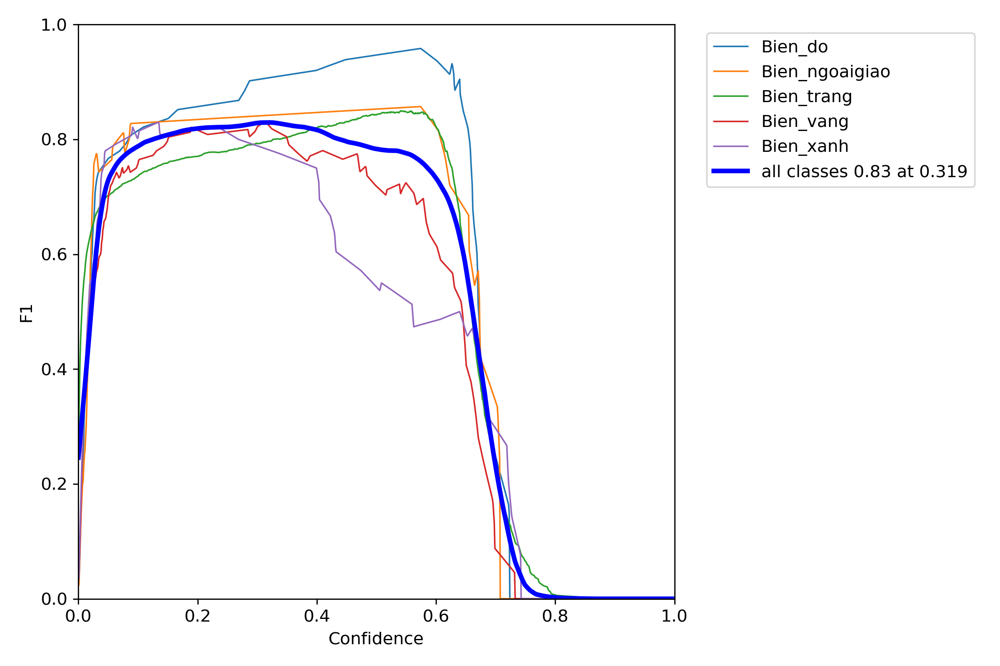

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/F1_curve.png', width=1000)

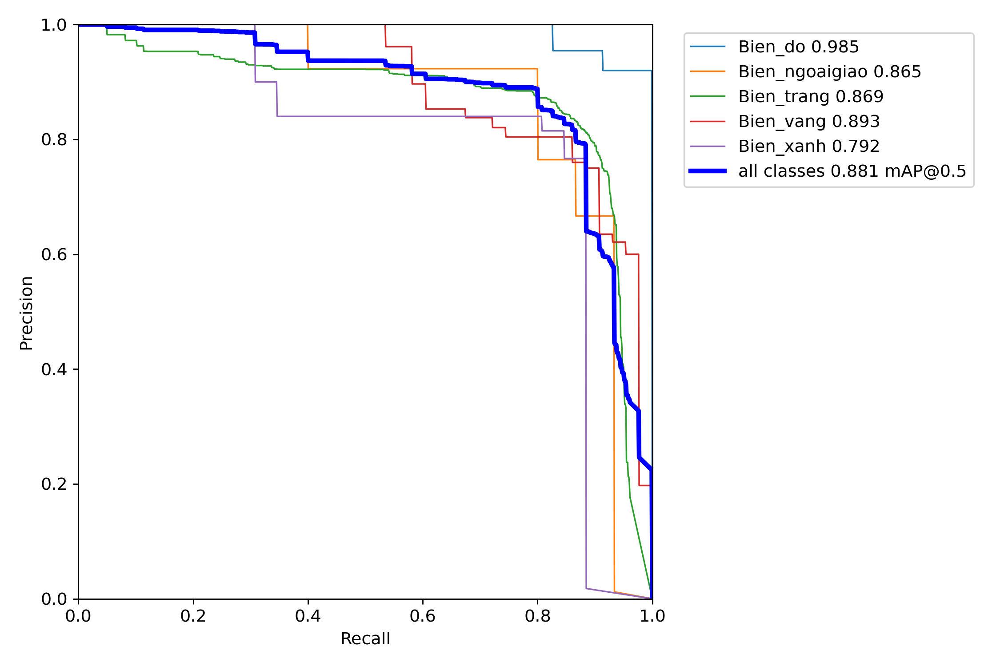

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/PR_curve.png', width=1000)

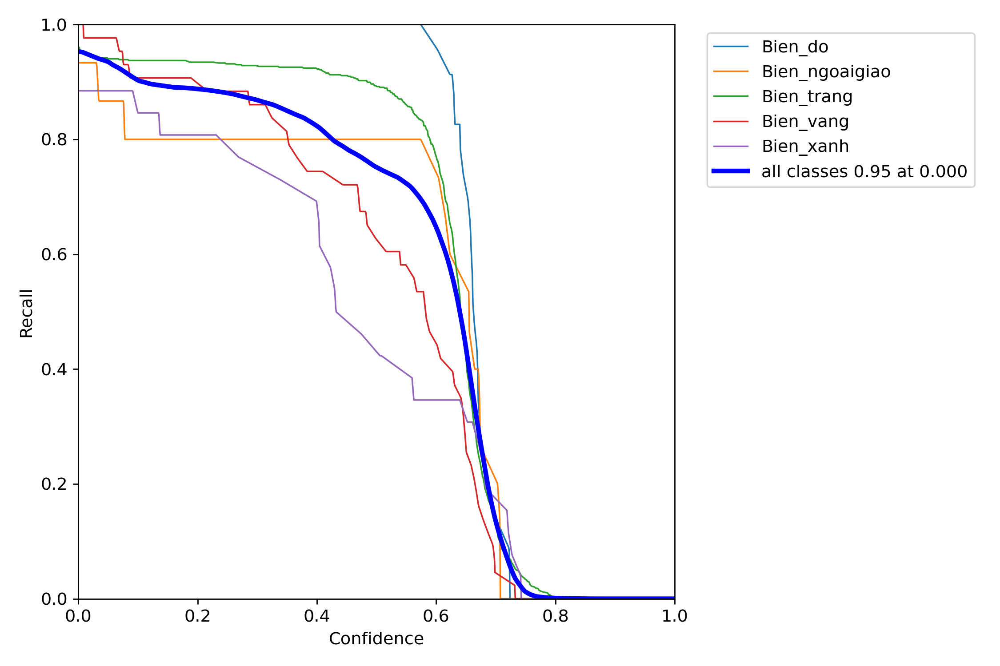

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/R_curve.png', width=1000)

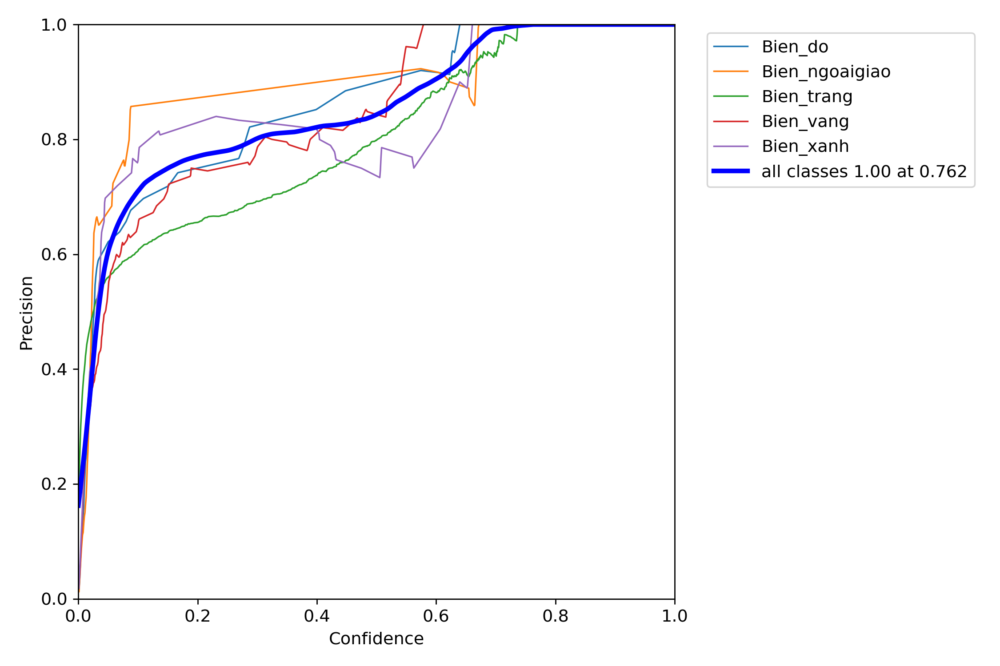

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/P_curve.png', width=1000)

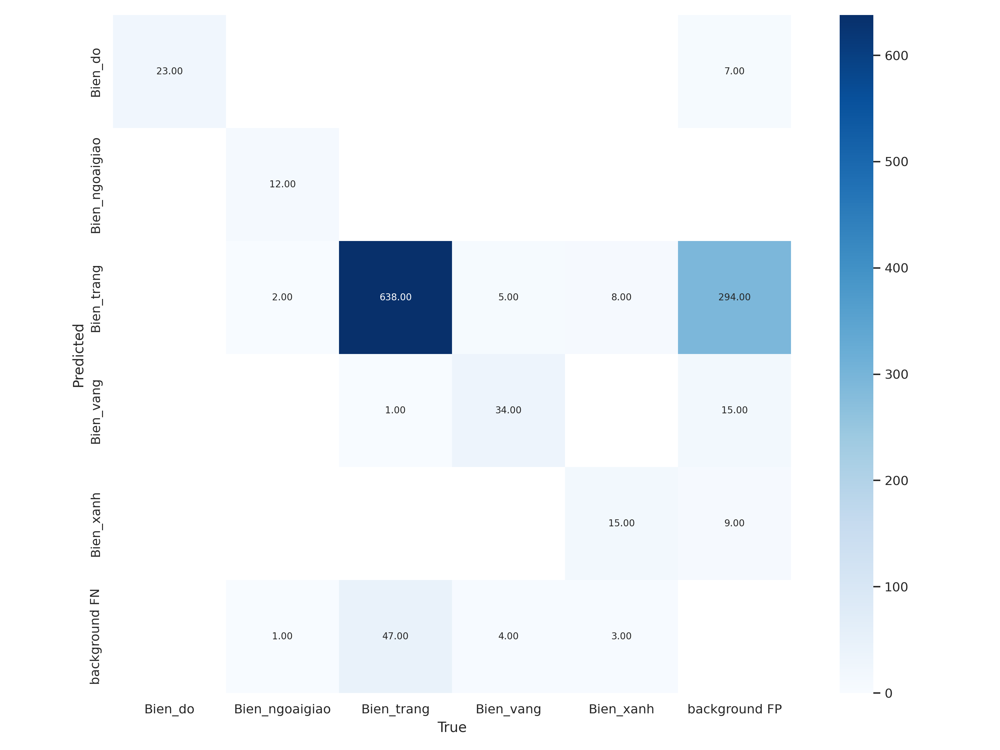

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/confusion_matrix.png', width=1000)

[Errno 2] No such file or directory: '{HOME}'
/content/yolov5


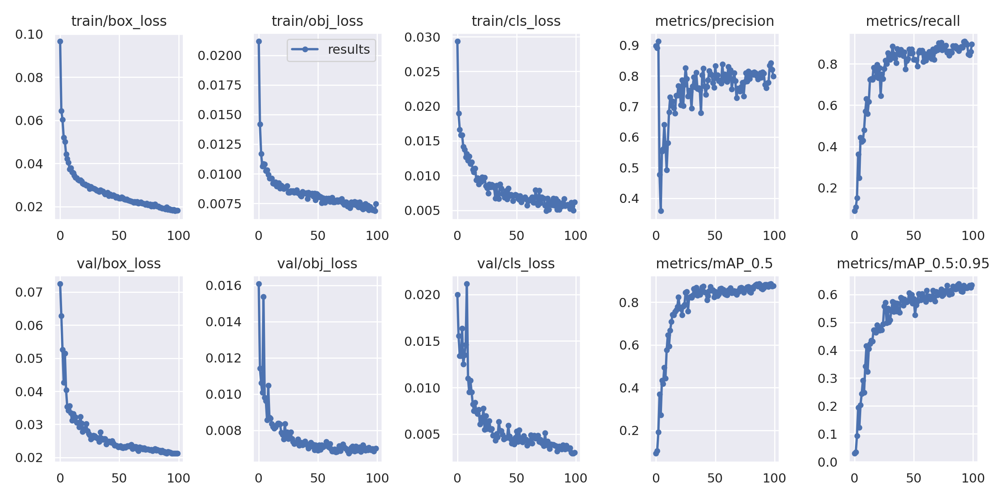

In [ ]:
%cd {HOME}
Image(filename=f'/content/yolov5/runs/train/exp/results.png', width=1000)

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

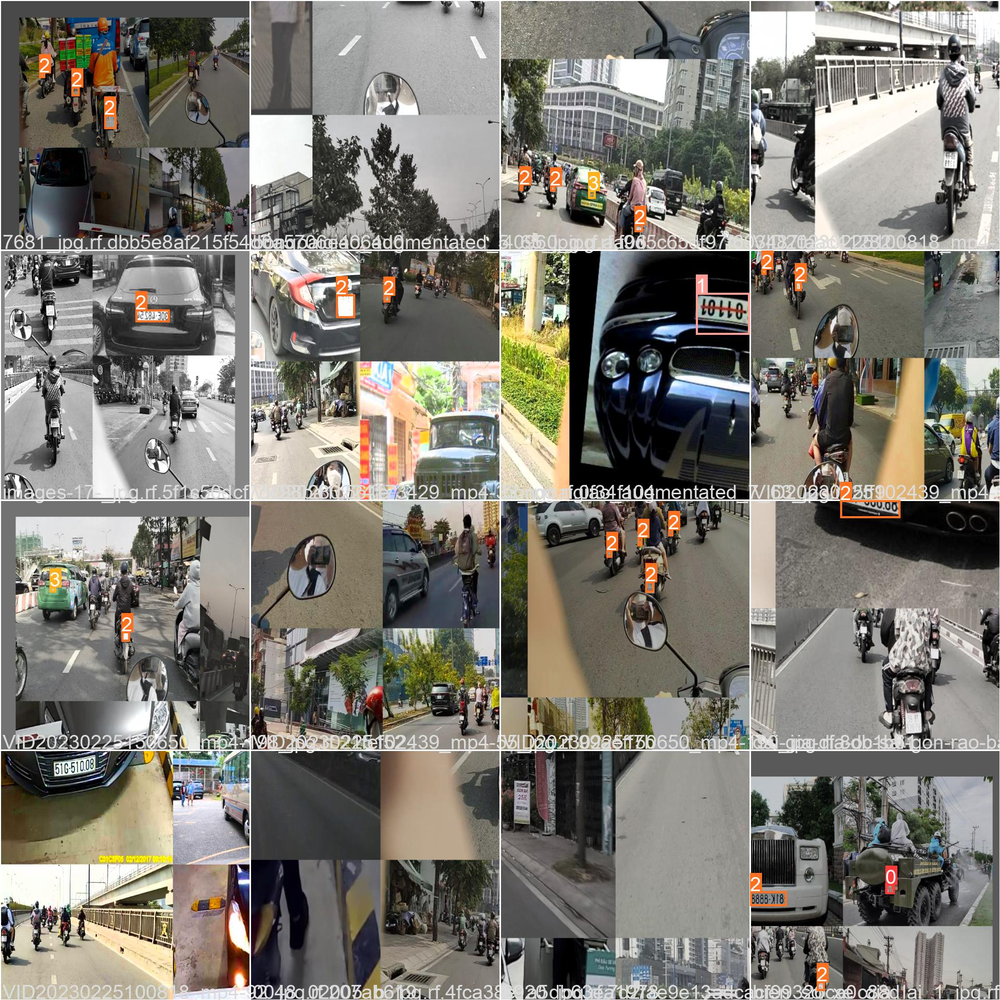

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/train_batch0.jpg', width=1000)

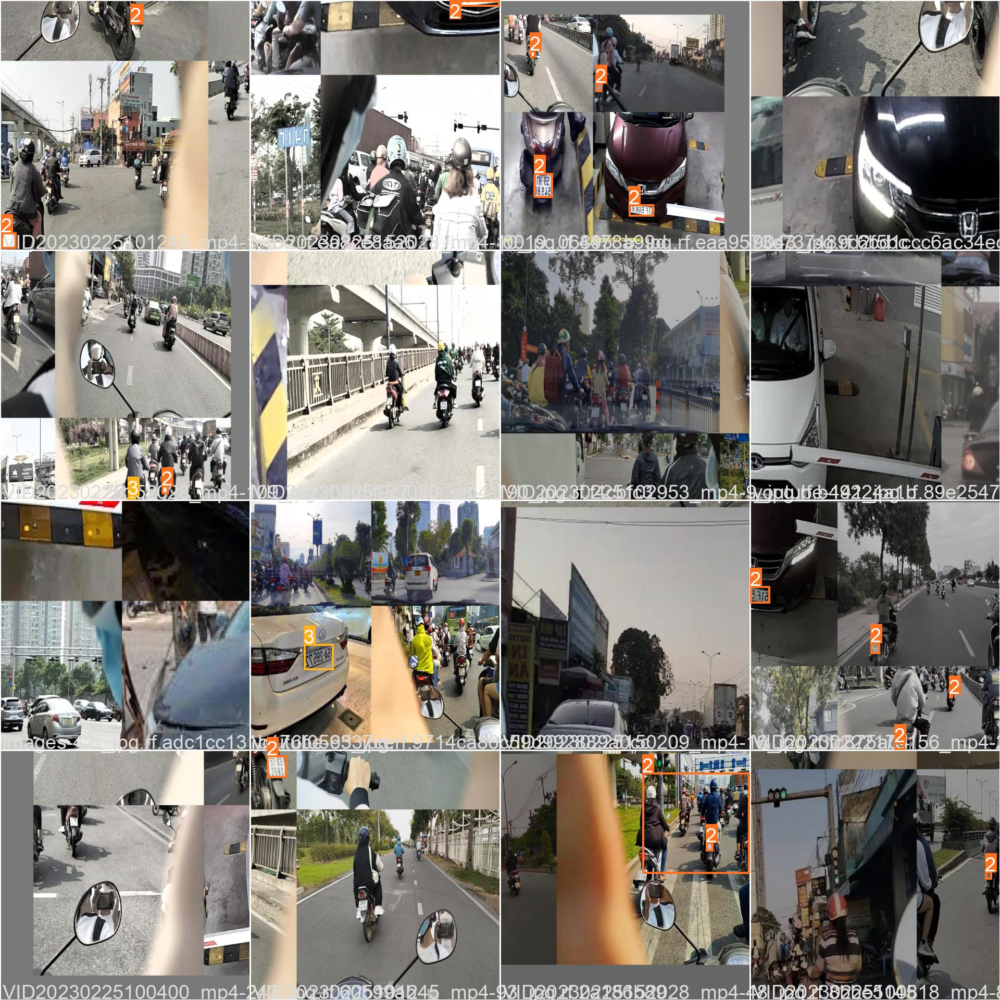

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/train_batch1.jpg', width=1000)

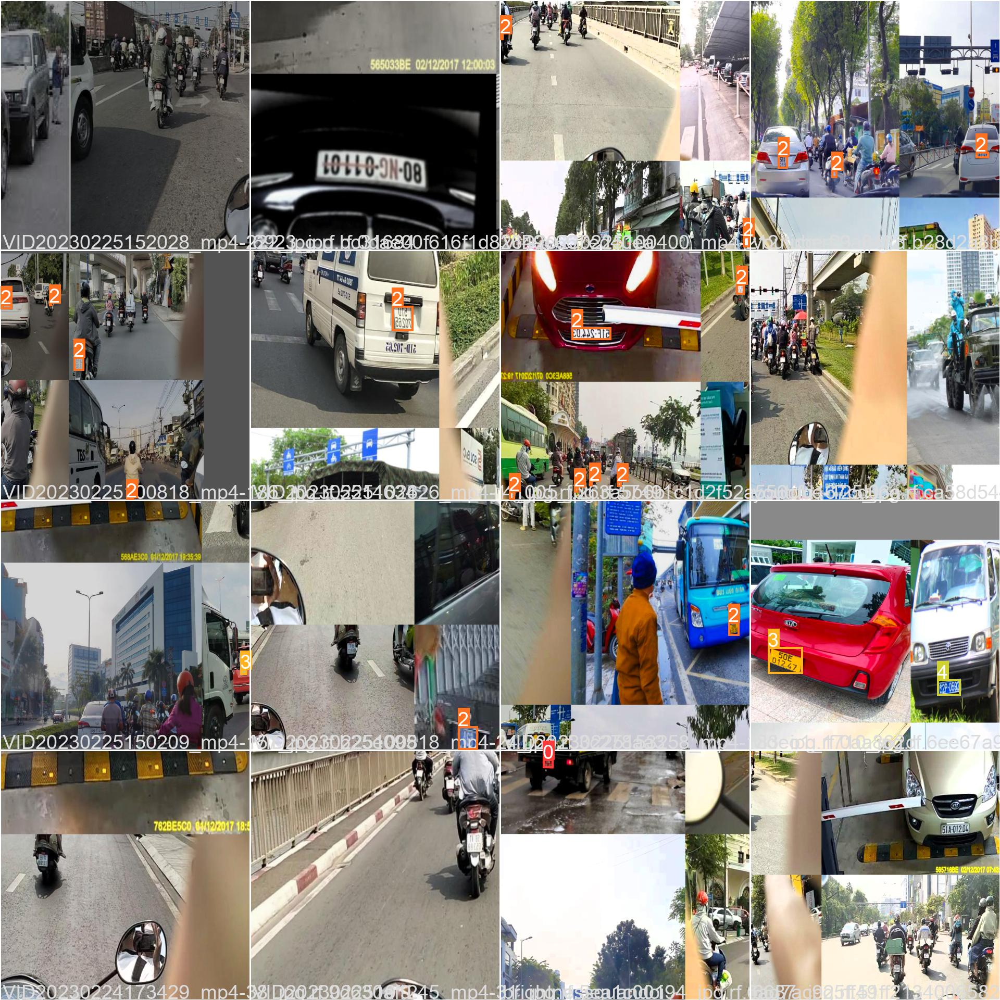

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/train_batch2.jpg', width=1000)

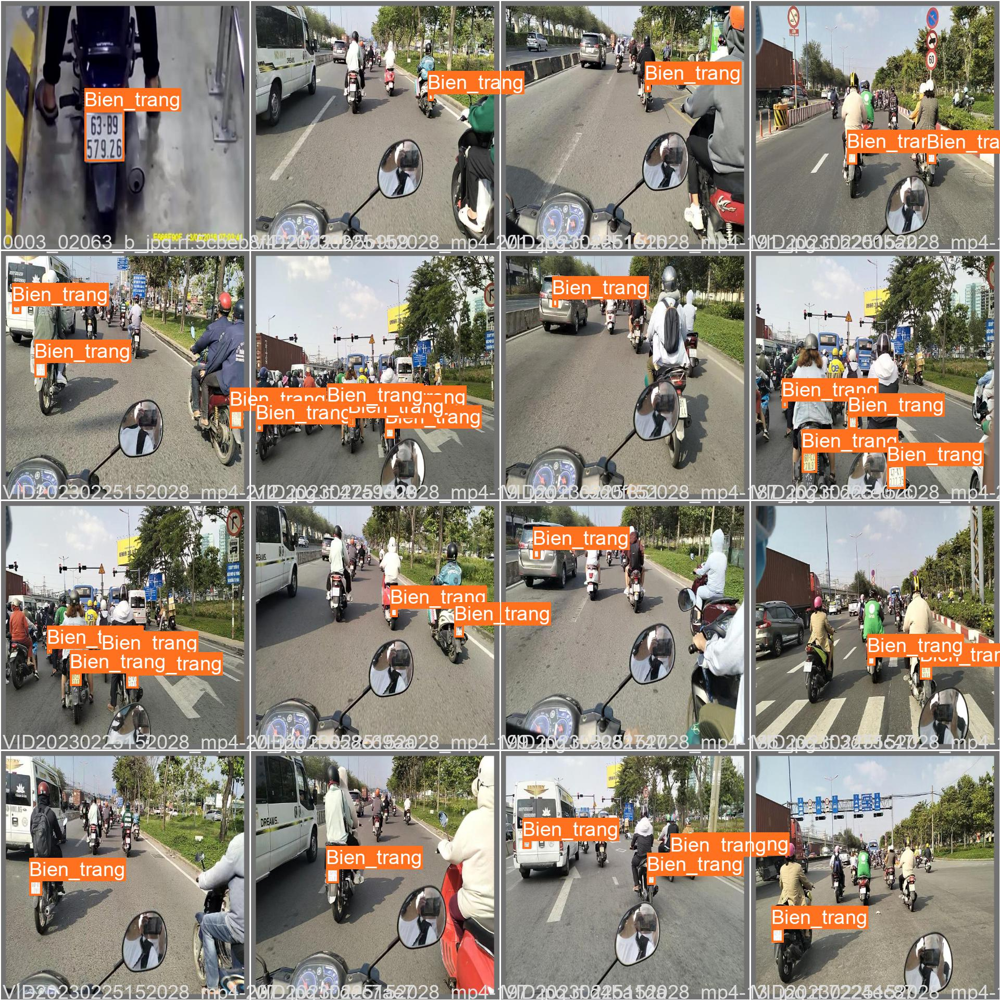

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=1000)

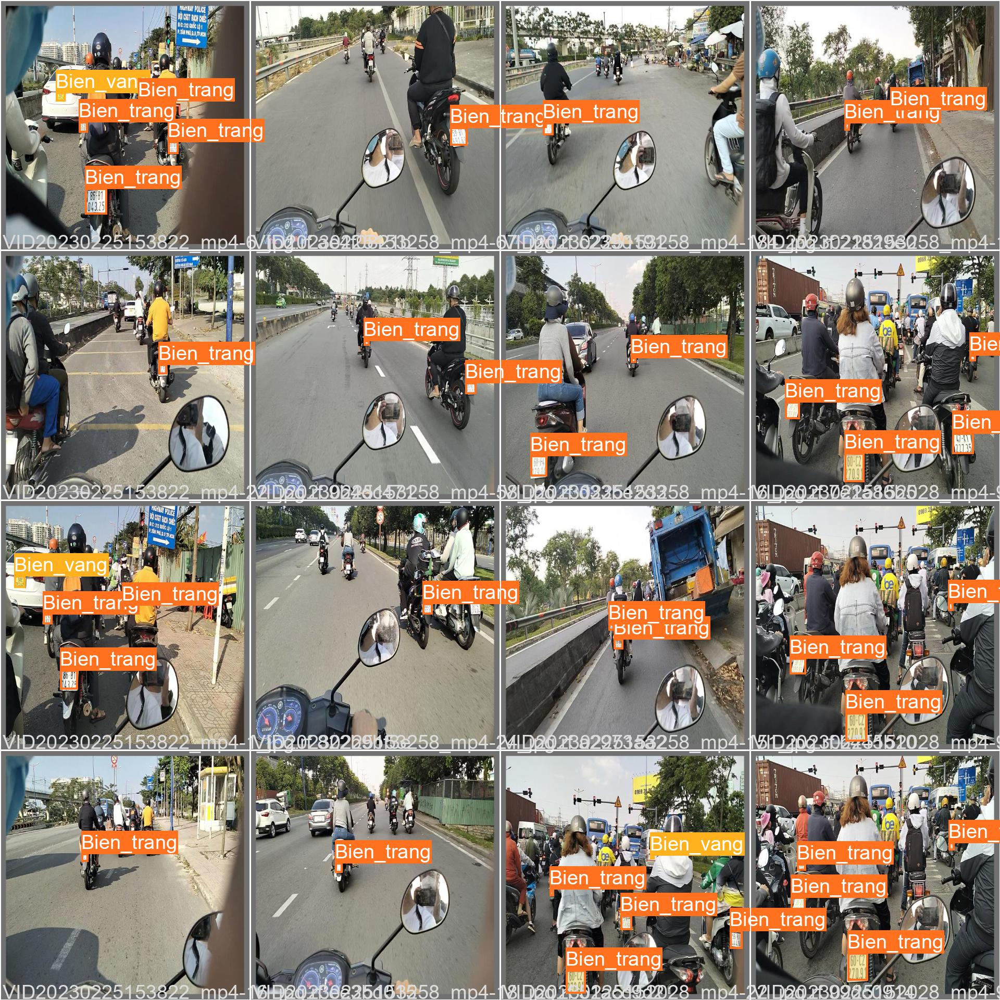

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch1_labels.jpg', width=1000)

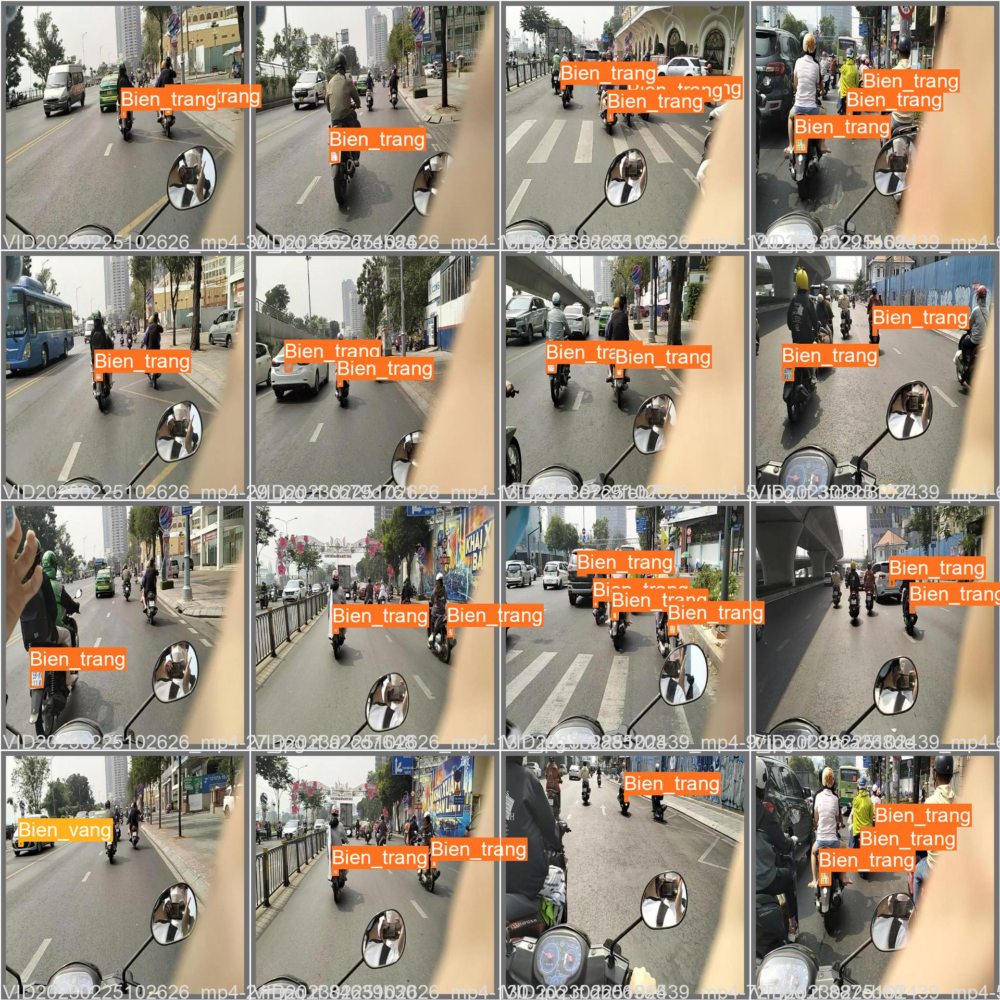

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch2_labels.jpg', width=1000)

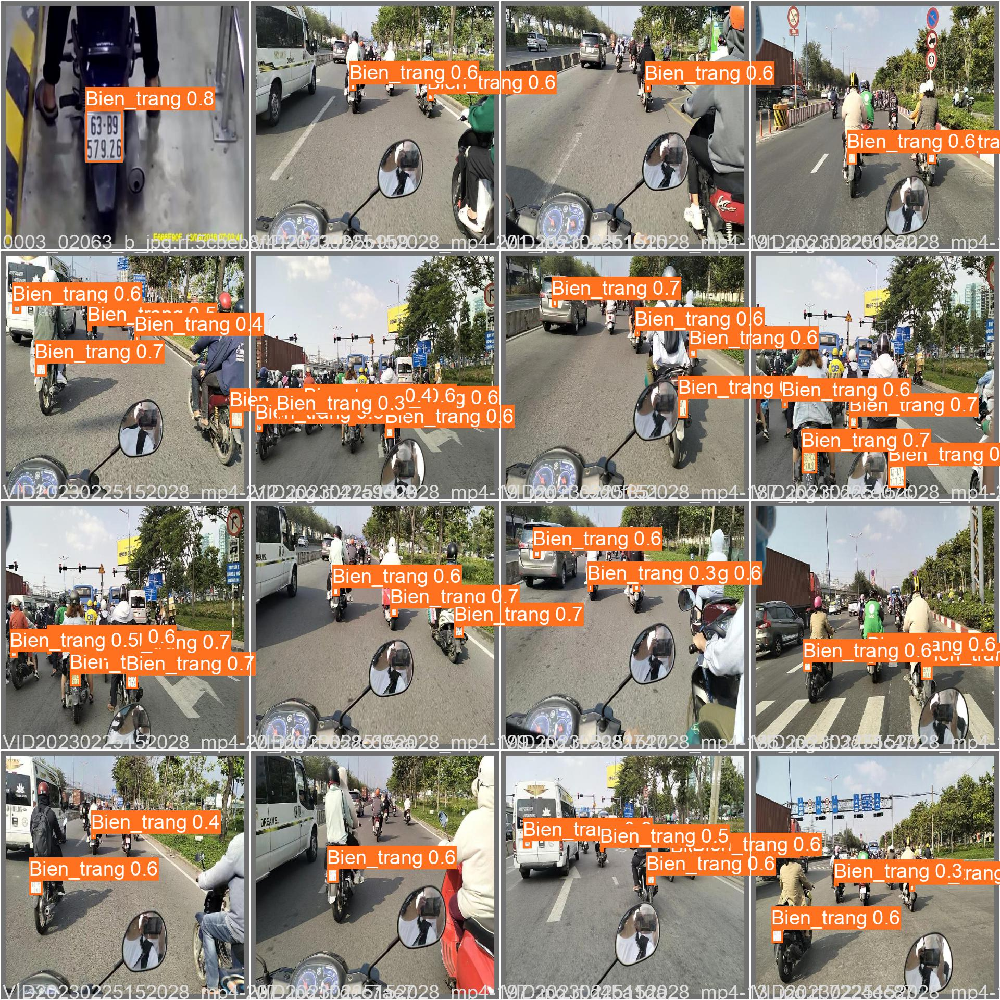

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=1000)

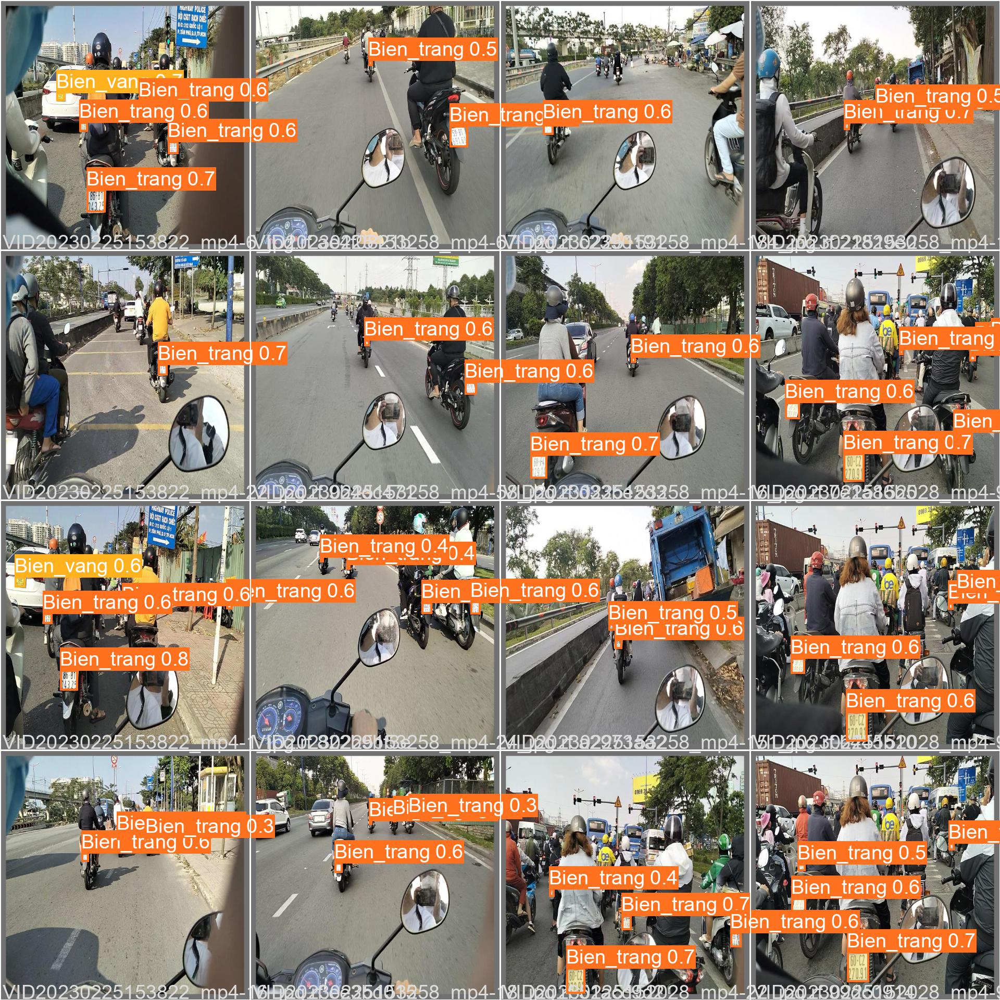

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch1_pred.jpg', width=1000)

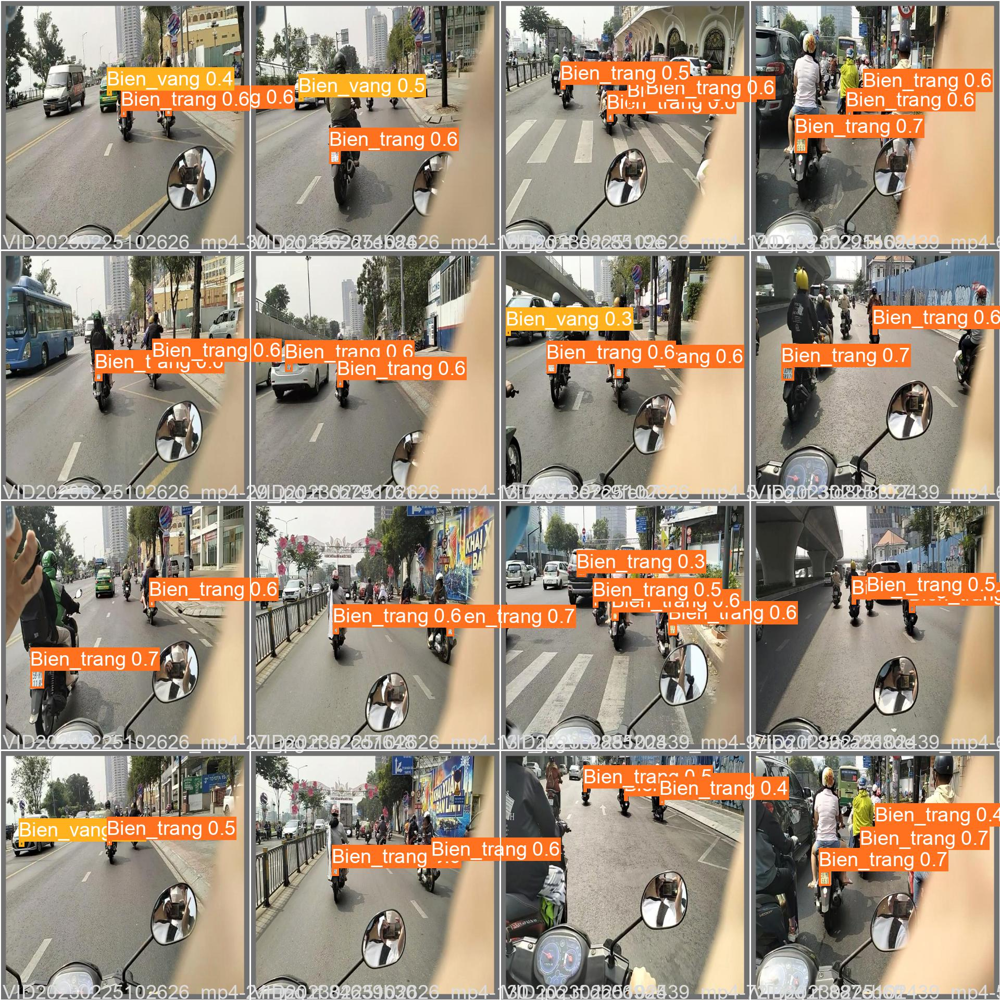

In [ ]:
Image(filename=f'/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1000)

In [ ]:
import pandas as pd
pd.read_csv('/content/yolov5/runs/train/exp/results.csv')

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.096666,0.021182,0.029346,0.89869,0.08863,0.092058,0.029762,0.072494,0.016082,0.019980,0.003303,0.003303,0.070275
1,1,0.064458,0.014178,0.018952,0.89217,0.10758,0.104070,0.034641,0.062845,0.011423,0.015571,0.006570,0.006570,0.040210
2,2,0.060320,0.011688,0.016627,0.91353,0.15119,0.191690,0.093501,0.052580,0.010612,0.013418,0.009772,0.009772,0.010078
3,3,0.052035,0.010629,0.015853,0.47645,0.36281,0.370350,0.194580,0.042628,0.010089,0.013405,0.009703,0.009703,0.009703
4,4,0.050182,0.010862,0.015821,0.35809,0.24730,0.271260,0.122550,0.051527,0.015379,0.016365,0.009703,0.009703,0.009703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,0.018241,0.007087,0.005240,0.77811,0.89336,0.872780,0.624240,0.021273,0.006920,0.003520,0.000694,0.000694,0.000694
96,96,0.018691,0.006956,0.006121,0.83429,0.84732,0.884050,0.628460,0.021206,0.006977,0.003049,0.000595,0.000595,0.000595
97,97,0.017990,0.006946,0.005636,0.84231,0.84322,0.885670,0.632670,0.021249,0.006838,0.002931,0.000496,0.000496,0.000496
98,98,0.018244,0.006865,0.004960,0.82135,0.85796,0.874490,0.624860,0.021250,0.006983,0.002948,0.000397,0.000397,0.000397


In [ ]:
import shutil
shutil.copytree("/content/yolov5/runs/train/exp", "/content/drive/MyDrive/data/train1")

'/content/drive/MyDrive/data/train1'

#Tiến hành detect tập test
Sau khi có được trong số thích hợp best.pt tiến hành detect với tập test

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/BIENSOXE-10/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, censor=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 


In [ ]:

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Lưu file best.pt để có thể detect sau này  

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
shutil.copytree("/content/yolov5/runs/detect/exp", "/content/drive/MyDrive/data/predict")

#Làm mờ video với detect.py

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --censor --img 640 --source /content/yolov5/BIENSOXE-10/test/images/7094_jpg.rf.90e10516b39de539d1d46d19a9b562a7.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/BIENSOXE-10/test/images/7094_jpg.rf.90e10516b39de539d1d46d19a9b562a7.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, censor=True, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/yolov5/BIENSOXE-10/test/images/7094_jpg.rf.90e10516b39de539d1d46d19a9b562a7.jpg: 640x640 1 Bien_trang, Done. (0.027s)
Speed: 0.6ms pre-process, 27.0ms inference, 79.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2

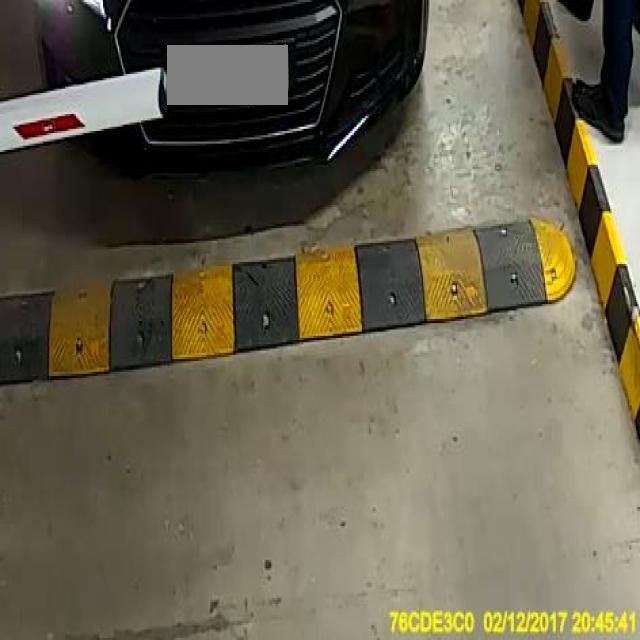

In [ ]:
Image(filename=f'/content/yolov5/runs/detect/exp2/7094_jpg.rf.90e10516b39de539d1d46d19a9b562a7.jpg', width=1000)https:\\\\colab.research.google.com\\8b368c8b-d999-41b5-a2ea-423a883f7040

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --censor --img 640 --source /content/yolov5/BIENSOXE-10/test/images/VID20230225100818_mp4-33_jpg.rf.254c6cb920d0d04a555828cdf90bf7f0.jpg

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/BIENSOXE-10/test/images/VID20230225100818_mp4-33_jpg.rf.254c6cb920d0d04a555828cdf90bf7f0.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, censor=True, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-gecc2bde Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/yolov5/BIENSOXE-10/test/images/VID20230225100818_mp4-33_jpg.rf.254c6cb920d0d04a555828cdf90bf7f0.jpg: 640x640 3 Bien_trangs, Done. (0.027s)
Speed: 0.6ms pre-process, 26.9ms inference, 77.7ms NMS per image at shape (1, 3, 64

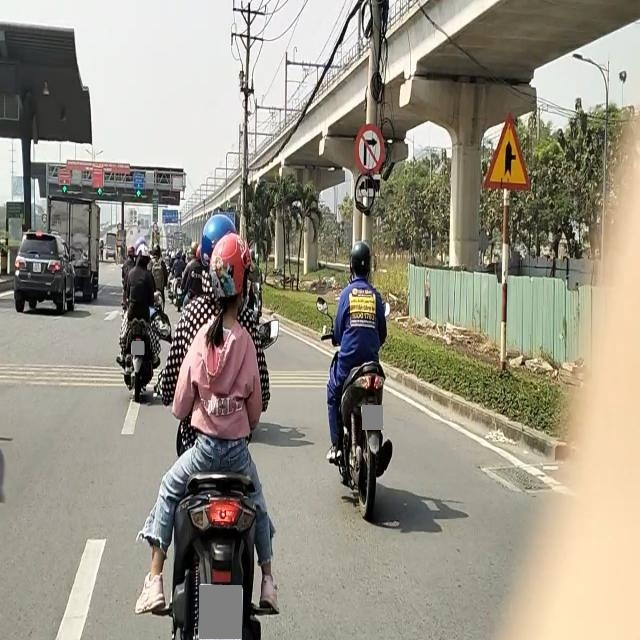

In [ ]:
Image(filename=f'/content/yolov5/runs/detect/exp4/VID20230225100818_mp4-33_jpg.rf.254c6cb920d0d04a555828cdf90bf7f0.jpg', width=1000)

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --censor --img 640 --source /content/video_1.mp4 --save-video --project /content/output_folder --name output.mp4

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --censor --img 640 --source /content/video_1.mp4 --save-video --project /content/output_folder --name output.mp4

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --source /content/drive/MyDrive/video_xe/video_goc
